Selon l'Organisation mondiale de la santé (OMS), l'accident vasculaire cérébral (AVC) est la deuxième cause de décès dans le monde, responsable d'environ 11 % du total des décès.
Cet ensemble de données est utilisé pour prédire si un patient est susceptible de subir un AVC en fonction de paramètres d'entrée tels que le sexe, l'âge, diverses maladies et le statut tabagique. Chaque ligne des données fournit des informations pertinentes sur le patient.

Informations sur les attributs
1) id : identifiant unique
2) sexe : « Homme », « Femme » ou « Autre »
3) âge : âge du patient
4) hypertension : 0 si le patient n'a pas d'hypertension, 1 si le patient a de l'hypertension
5) maladie_cardiaque : 0 si le patient n'a aucune maladie cardiaque, 1 si le patient a une maladie cardiaque
6) déjà_marié : « Non » ou « Oui »
7) type_de_travail : « enfants », « Gouvernement », « Jamais_travaillé », « Privé » ou « Travailleur indépendant »
8) Type_de_résidence : « Rural » ou « Urbain »
9) niveau_de_glucose_moyenne : taux moyen de glucose dans le sang
10) imc : indice de masse corporelle
11) statut_de_tabagisme : « ancien fumeur », « n'a jamais fumé », « fume » ou « Inconnu »*
12) accident_vasculaire cérébral : 1 si le patient a eu un accident vasculaire cérébral ou 0 sinon
*Remarque : « Inconnu » dans smoking_status signifie que l'information n'est pas disponible pour ce patient

Remerciements
(Source confidentielle) - Utiliser uniquement à des fins éducatives.
Si vous utilisez cet ensemble de données dans votre recherche, veuillez créditer l'auteur.

<h1>EXPLORATION</h1>
<h3>objectif</h3>
<li>comprendre du mieux possible nos donnees </li>
<li>developper une premiere strategie de modelisation</li>
<h3>analyse de forme</h3>
<li>variable target :stroke</li>
<li>nombre de lignes et de colonnes : notre dataset possede 5110 lignes et 12 colonnes</li>
<li>type de variable : object (5),int6( ) ,
float 3( 3</i>l
<li> valeurs manquantes :presence de valeurs manquante sur IMC(3.9% de valeurs manquantes)</li>

<h3>analyse de fond :</h3>
<li>visualisation de la target : plus de 4000 cas negatif(0) et le reste positif </li>>

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns

In [2]:
data = pd.read_csv("C://Users//HIGH-TECH CORP'S//Downloads//archive (2)//healthcare-dataset-stroke-data.csv")

In [3]:
df = data.copy()
pd.set_option('display.max_rows', 9000)
df

,id,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,9046,Male,67.00,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,51676,Female,61.00,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,31112,Male,80.00,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,60182,Female,49.00,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,1665,Female,79.00,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1
5,56669,Male,81.00,0,0,Yes,Private,Urban,186.21,29.0,formerly smoked,1
6,53882,Male,74.00,1,1,Yes,Private,Rural,70.09,27.4,never smoked,1
7,10434,Female,69.00,0,0,No,Private,Urban,94.39,22.8,never smoked,1
8,27419,Female,59.00,0,0,Yes,Private,Rural,76.15,NaN,Unknown,1
9,60491,Female,78.00,0,0,Yes,Private,Urban,58.57,24.2,Unknown,1


In [4]:
print(f"notre dataset possede {df.shape[0]} lignes et {df.shape[1]} colonnes")

notre dataset possede 5110 lignes et 12 colonnes


object     5
int64      4
float64    3
Name: count, dtype: int64


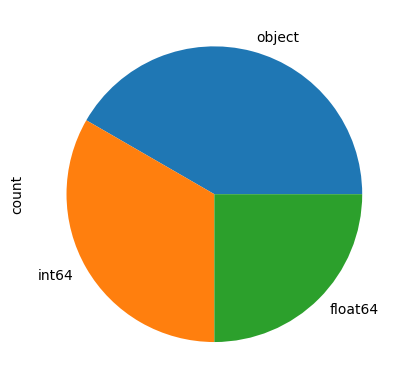

In [5]:
data.dtypes.value_counts().plot.pie()
print(data.dtypes.value_counts())

In [6]:
df.isnull().mean().sort_values(ascending = False)*100

bmi                  3.933464
id                   0.000000
gender               0.000000
age                  0.000000
hypertension         0.000000
heart_disease        0.000000
ever_married         0.000000
work_type            0.000000
Residence_type       0.000000
avg_glucose_level    0.000000
smoking_status       0.000000
stroke               0.000000
dtype: float64

<Axes: >

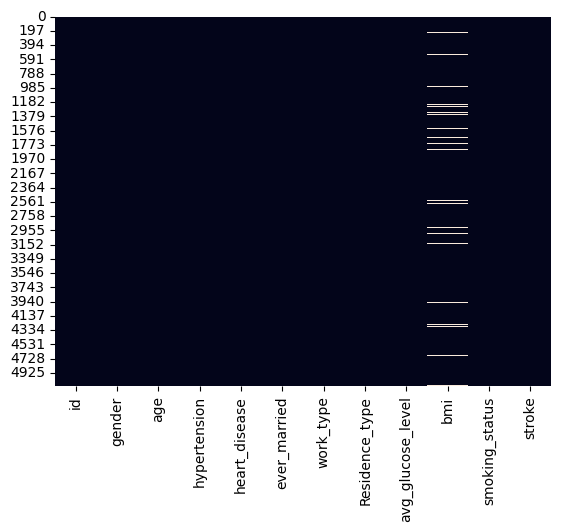

In [7]:
sns.heatmap(df.isnull(), cbar = False)

presence de valeurs manquante sur IMC(3.9% de valeurs manquantes)

In [8]:
## supprimons la colonne id##
df.drop('id',axis=1, inplace=True)
df.head()

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,Male,67.0,0,1,Yes,Private,Urban,228.69,36.6,formerly smoked,1
1,Female,61.0,0,0,Yes,Self-employed,Rural,202.21,NaN,never smoked,1
2,Male,80.0,0,1,Yes,Private,Rural,105.92,32.5,never smoked,1
3,Female,49.0,0,0,Yes,Private,Urban,171.23,34.4,smokes,1
4,Female,79.0,1,0,Yes,Self-employed,Rural,174.12,24.0,never smoked,1


stroke
0    0.951272
1    0.048728
Name: proportion, dtype: float64


<Axes: xlabel='stroke', ylabel='count'>

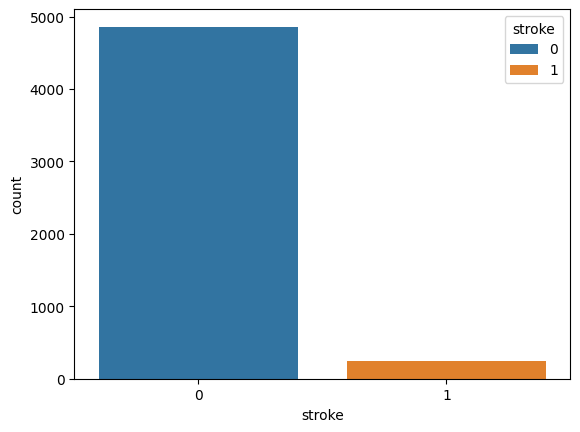

In [9]:
print(df.stroke.value_counts(normalize=True))
sns.countplot(x=df.stroke, data=df,hue ='stroke')

<h1> histogramme des variables continues</h1>

C:\Users\HIGH-TECH CORP'S\AppData\Local\Temp\ipykernel_7584\891075114.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[var])
C:\Users\HIGH-TECH CORP'S\AppData\Local\Temp\ipykernel_7584\891075114.py:3: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[var])
C:\Users\HIGH-TECH CORP'S\AppData\

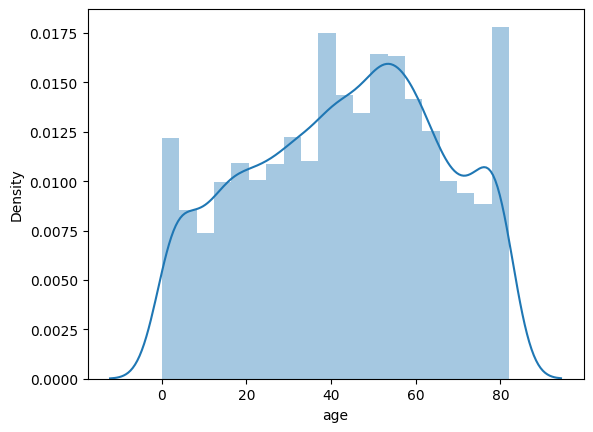

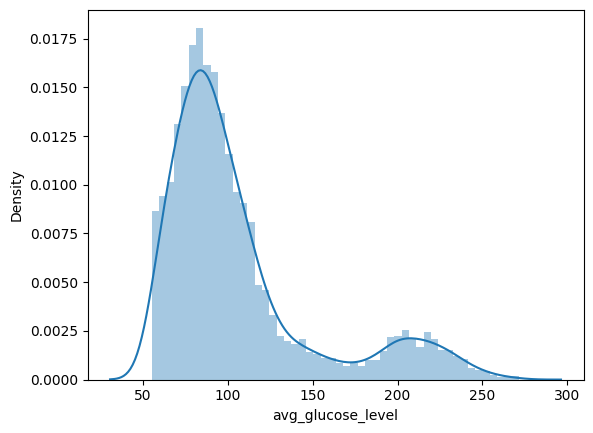

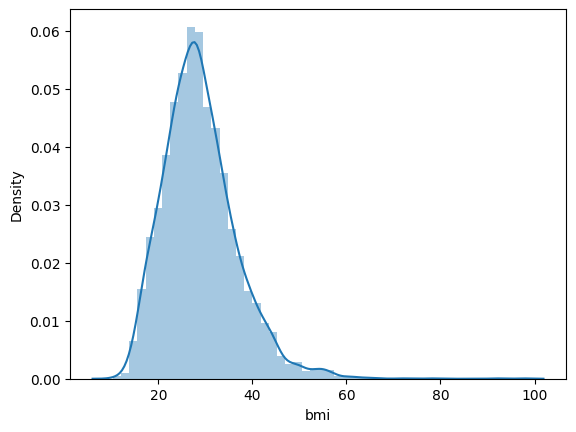

In [10]:
for var in df.select_dtypes('float') :
    plt.figure()
    sns.distplot(df[var])

ici nous pouvons noter que les valeurs de bmi sont centree autour de 30 cette information sera utile lors du remplacement des valeurs manquantes 
pour la variable avg_glucose_level nous pouvons noter que les valeurs sont centre autour de deux valeurs bon on ne peut pas dire grand chose dessus, pareil por l'age

<h3> graphe variable categorielle</h3>

In [11]:
for var in df.select_dtypes('object') :
    print(f'{var:-<50} {df[var].unique()}')

gender-------------------------------------------- ['Male' 'Female' 'Other']
ever_married-------------------------------------- ['Yes' 'No']
work_type----------------------------------------- ['Private' 'Self-employed' 'Govt_job' 'children' 'Never_worked']
Residence_type------------------------------------ ['Urban' 'Rural']
smoking_status------------------------------------ ['formerly smoked' 'never smoked' 'smokes' 'Unknown']


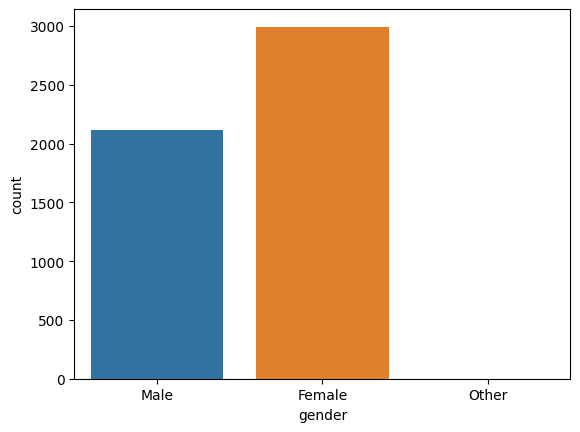

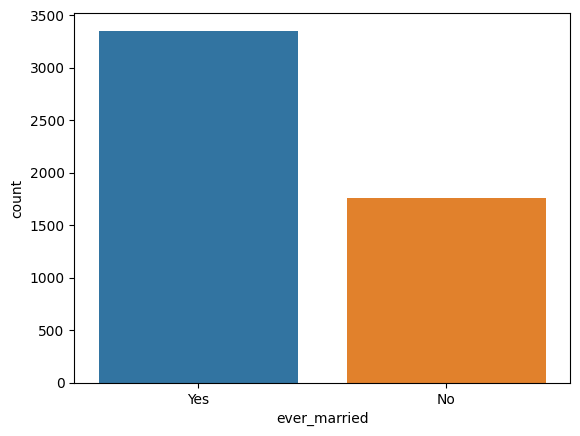

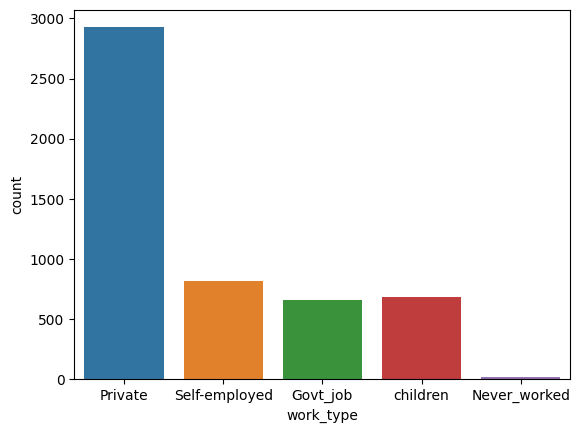

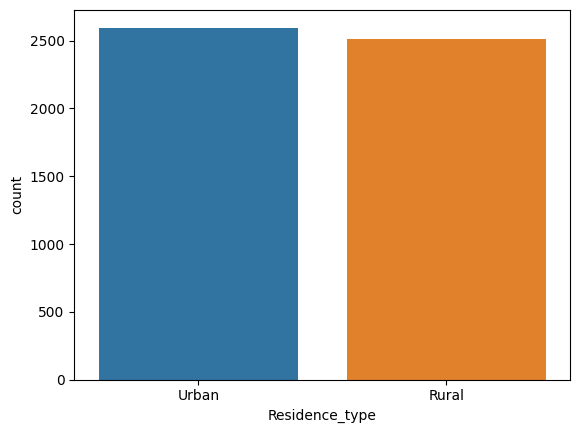

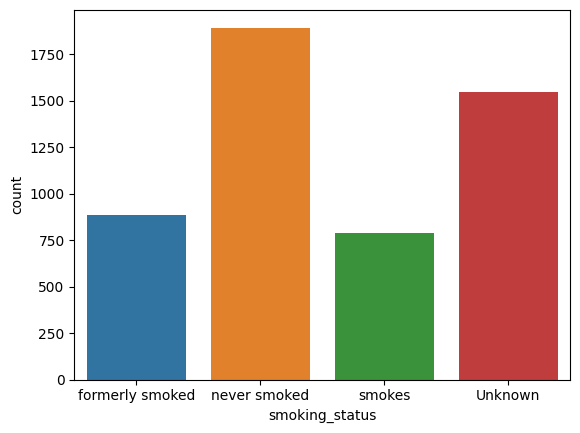

In [12]:
for var in df.select_dtypes('object') :
    plt.figure()
    sns.countplot(x=df[var],data=df,hue=var)

<h1>graphe des variables numerique </h3>

<Axes: xlabel='hypertension', ylabel='count'>

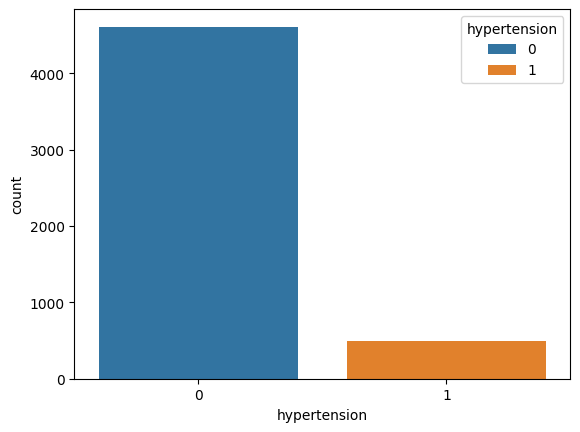

In [13]:
sns.countplot(x=df.hypertension,data=df,hue='hypertension')

on constate que le nombe de personne souffrant d'hypertension est minime

In [14]:
df.select_dtypes('int').columns

Index(['hypertension', 'heart_disease', 'stroke'], dtype='object')

<Axes: xlabel='heart_disease', ylabel='count'>

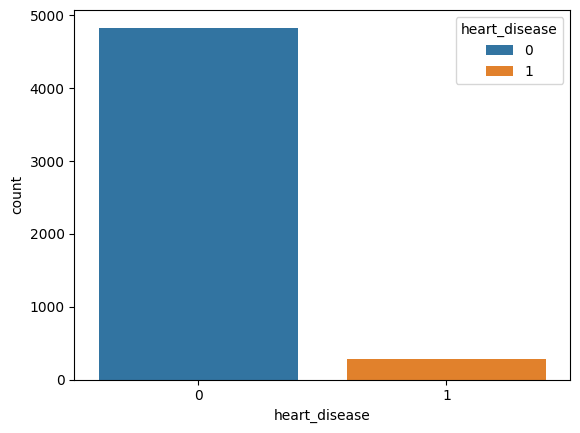

In [15]:
sns.countplot(x=df.heart_disease,data=df,hue='heart_disease')

peu de patients n'ont pas d'hypertention

<h3>relation target/variable</h3>

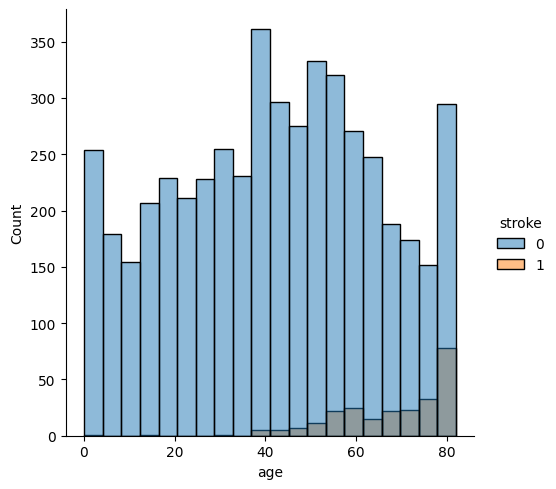

In [16]:
sns.displot(x='age',data=df,hue='stroke')

on voit bien que l'avc commence a etre present chez les individus de 40 ans et plus

<Axes: xlabel='work_type', ylabel='stroke'>

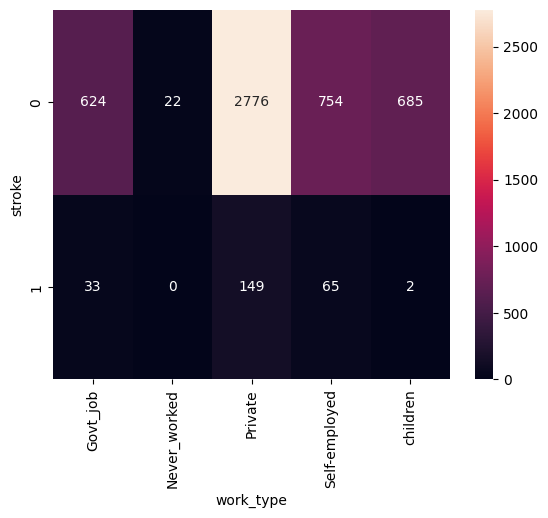

In [17]:

sns.heatmap(pd.crosstab(df.stroke,df.work_type),annot=True,fmt='d')

ceux qui ne pravaille pas ne sont pas succeptible d'avoir l'avc, les enfants aussi ne sont pas succeptible d'en avoir 

<Axes: xlabel='ever_married', ylabel='stroke'>

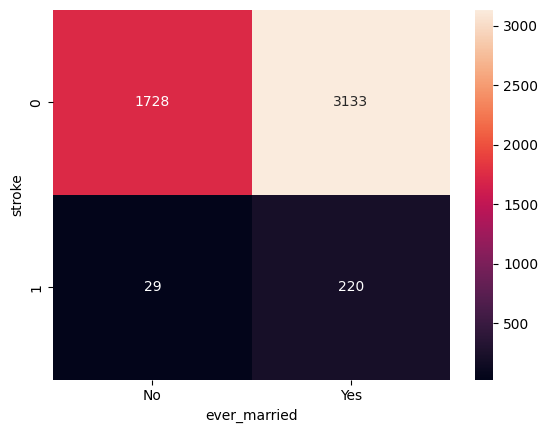

In [18]:
sns.heatmap(pd.crosstab(df.stroke,df.ever_married),annot=True,fmt='d')

ici on constate que peut de personnes non marriees ne possedent pas l'avc

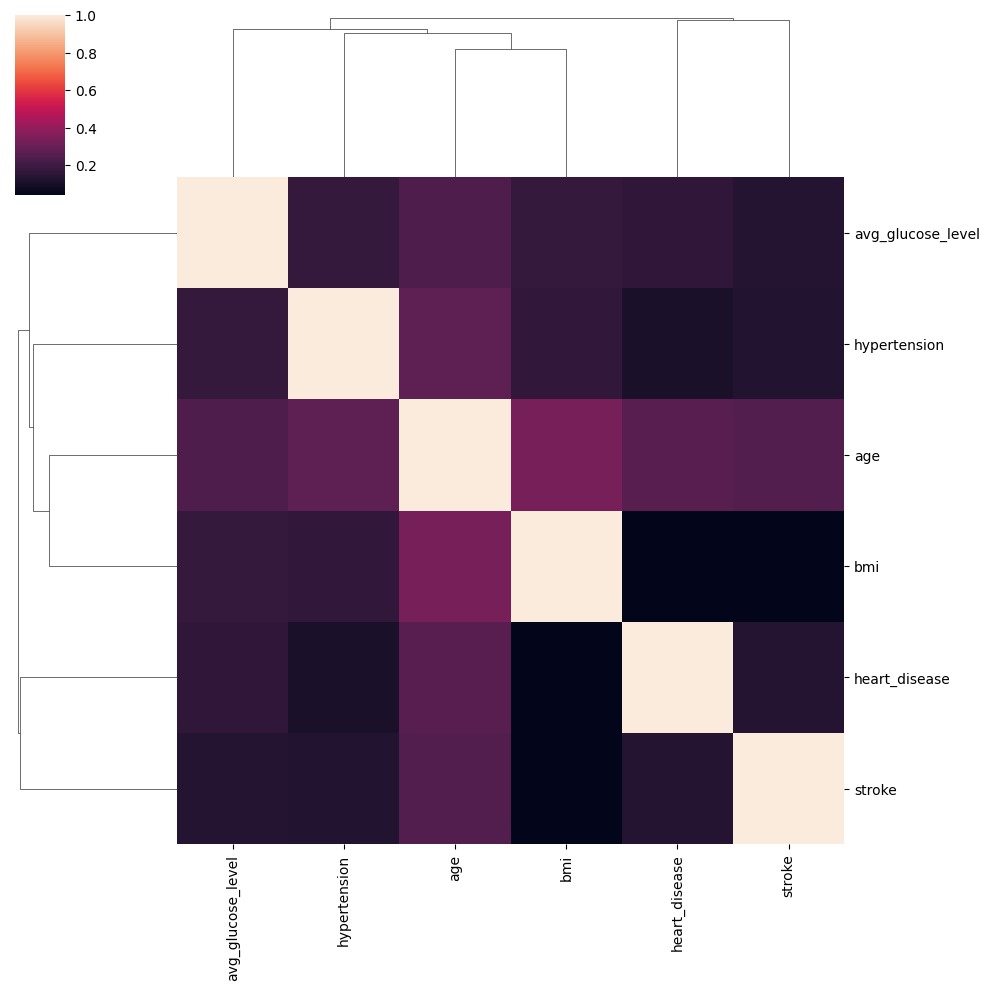

In [19]:
sns.clustermap(df.select_dtypes(exclude='object').corr())

pas de correlation forte entre nos donnees

<h1>preprocessing</h1>

<h3>encodage</h3>

In [20]:
def encodage(df):
    code={'Male' :1,'Female':2,'Other':3,
     'Private':1,'Self-employed':2,'Govt_job':3,'children':4,'Never_worked':5,
     'Urban':1,'Rural':0,
     'formerly smoked':1,'never smoked':2,'smokes':3,'Unknown':4,
         'Yes':1, 'No':0}
    for i in df.select_dtypes('object').columns:
        df.loc[:,i] = df[i].map(code)
    return df

In [21]:
df=encodage(df)
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.00,0,1,1,1,1,228.69,36.6,1,1
1,2,61.00,0,0,1,2,0,202.21,NaN,2,1
2,1,80.00,0,1,1,1,0,105.92,32.5,2,1
3,2,49.00,0,0,1,1,1,171.23,34.4,3,1
4,2,79.00,1,0,1,2,0,174.12,24.0,2,1
5,1,81.00,0,0,1,1,1,186.21,29.0,1,1
6,1,74.00,1,1,1,1,0,70.09,27.4,2,1
7,2,69.00,0,0,0,1,1,94.39,22.8,2,1
8,2,59.00,0,0,1,1,0,76.15,NaN,4,1
9,2,78.00,0,0,1,1,1,58.57,24.2,4,1


In [22]:
df['bmi']=df['bmi'].fillna(df['bmi'].mean())
df

,gender,age,hypertension,heart_disease,ever_married,work_type,Residence_type,avg_glucose_level,bmi,smoking_status,stroke
0,1,67.00,0,1,1,1,1,228.69,36.600000,1,1
1,2,61.00,0,0,1,2,0,202.21,28.893237,2,1
2,1,80.00,0,1,1,1,0,105.92,32.500000,2,1
3,2,49.00,0,0,1,1,1,171.23,34.400000,3,1
4,2,79.00,1,0,1,2,0,174.12,24.000000,2,1
5,1,81.00,0,0,1,1,1,186.21,29.000000,1,1
6,1,74.00,1,1,1,1,0,70.09,27.400000,2,1
7,2,69.00,0,0,0,1,1,94.39,22.800000,2,1
8,2,59.00,0,0,1,1,0,76.15,28.893237,4,1
9,2,78.00,0,0,1,1,1,58.57,24.200000,4,1


In [23]:
from sklearn.model_selection import train_test_split

In [24]:
    X = df.drop('stroke', axis = 1)
    y = df['stroke']

In [25]:
X_train,X_test,y_train,y_test = train_test_split (X,y, test_size = 0.2, random_state=0)

In [26]:
from sklearn.tree import DecisionTreeClassifier

In [27]:
def evaluate(model):
    model.fit(X_train,y_train)
    ypred= model.predict(X_test)
    print(confusion_matrix(y_test,ypred))
    print(classification_report(y_test,ypred))
    N, train_score, val_score = learning_curve(model,X_train,y_train, cv=4, train_sizes=np.linspace(0.1,1,10), scoring='f1')
    plt.figure(figsize=(12,8))
    plt.plot(N,train_score.mean(axis=1), label="train score")
    plt.plot(N,val_score.mean(axis=1), label="val score")
    plt.legend()

In [37]:
from sklearn.metrics import f1_score, confusion_matrix,classification_report
from sklearn.model_selection import learning_curve,GridSearchCV
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import PolynomialFeatures,RobustScaler,PowerTransformer,OneHotEncoder,StandardScaler,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.compose import make_column_selector,make_column_transformer
from sklearn.impute import SimpleImputer
from sklearn.naive_bayes import GaussianNB

<h3>evaluation</h3>

[[872  96]
 [ 30  24]]
              precision    recall  f1-score   support

           0       0.97      0.90      0.93       968
           1       0.20      0.44      0.28        54

    accuracy                           0.88      1022
   macro avg       0.58      0.67      0.60      1022
weighted avg       0.93      0.88      0.90      1022



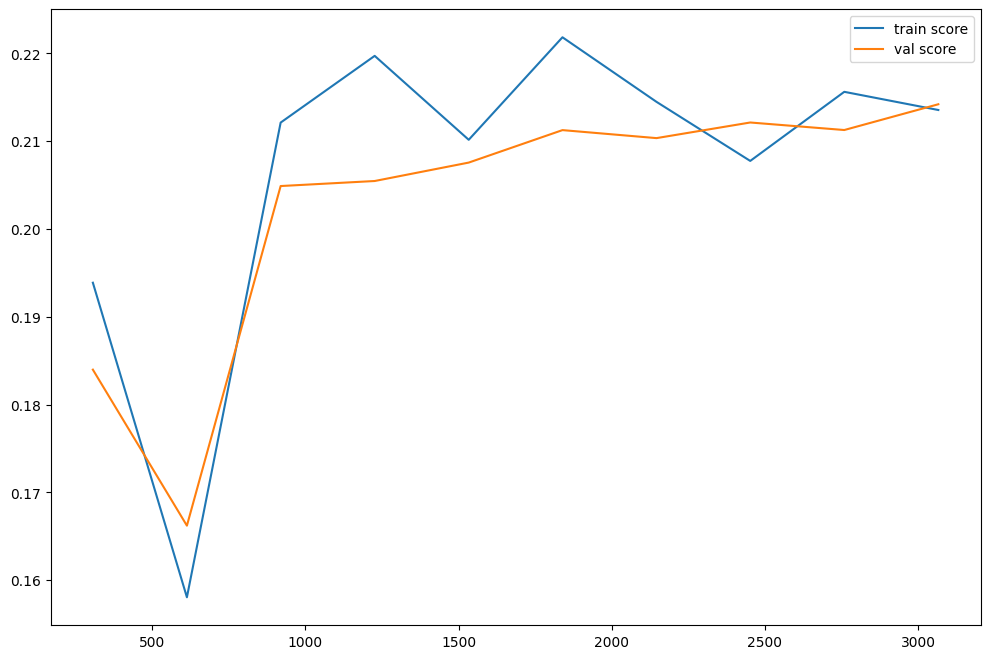

In [34]:
evaluate(GaussianNB())

In [38]:
randomForest=make_pipeline(RobustScaler(),RandomForestClassifier(random_state=0))
adaboos= make_pipeline(RobustScaler(),AdaBoostClassifier(random_state=0))
SVM= make_pipeline(RobustScaler(),SVC(random_state=0))
KNN= make_pipeline(RobustScaler(),KNeighborsClassifier())
deci= make_pipeline(RobustScaler(),DecisionTreeClassifier())
gauss= make_pipeline(RobustScaler(),GaussianNB())

In [39]:
list_of_models={'randomForest':randomForest,'adaboost':adaboos,'SVM':SVM,'Kneigh':KNN,'des':deci,'gauss':gauss}

Pipeline(steps=[('robustscaler', RobustScaler()),
                ('randomforestclassifier',
                 RandomForestClassifier(random_state=0))])
[[967   1]
 [ 53   1]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       968
           1       0.50      0.02      0.04        54

    accuracy                           0.95      1022
   macro avg       0.72      0.51      0.50      1022
weighted avg       0.92      0.95      0.92      1022

Pipeline(steps=[('robustscaler', RobustScaler()),
                ('adaboostclassifier', AdaBoostClassifier(random_state=0))])


C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


[[966   2]
 [ 54   0]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       968
           1       0.00      0.00      0.00        54

    accuracy                           0.95      1022
   macro avg       0.47      0.50      0.49      1022
weighted avg       0.90      0.95      0.92      1022



C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(
C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\ensemble\_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is 

Pipeline(steps=[('robustscaler', RobustScaler()), ('svc', SVC(random_state=0))])
[[968   0]
 [ 54   0]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       968
           1       0.00      0.00      0.00        54

    accuracy                           0.95      1022
   macro avg       0.47      0.50      0.49      1022
weighted avg       0.90      0.95      0.92      1022



C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\metrics\_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, mo

Pipeline(steps=[('robustscaler', RobustScaler()),
                ('kneighborsclassifier', KNeighborsClassifier())])
[[965   3]
 [ 53   1]]
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       968
           1       0.25      0.02      0.03        54

    accuracy                           0.95      1022
   macro avg       0.60      0.51      0.50      1022
weighted avg       0.91      0.95      0.92      1022

Pipeline(steps=[('robustscaler', RobustScaler()),
                ('decisiontreeclassifier', DecisionTreeClassifier())])
[[922  46]
 [ 46   8]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       968
           1       0.15      0.15      0.15        54

    accuracy                           0.91      1022
   macro avg       0.55      0.55      0.55      1022
weighted avg       0.91      0.91      0.91      1022

Pipeline(steps=[('robustscaler', RobustScaler()), ('gaussiannb

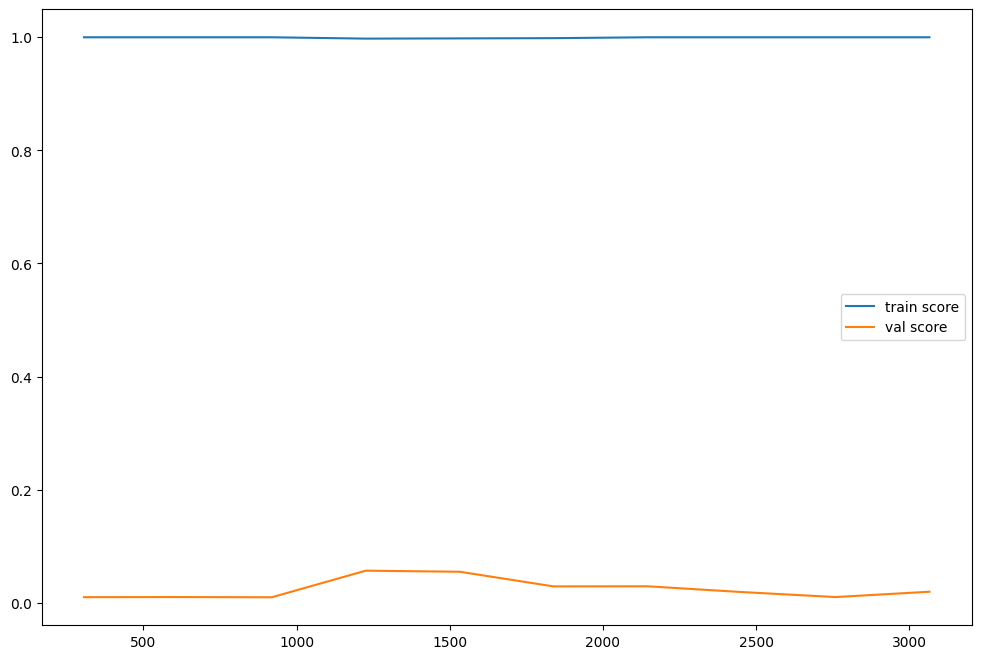

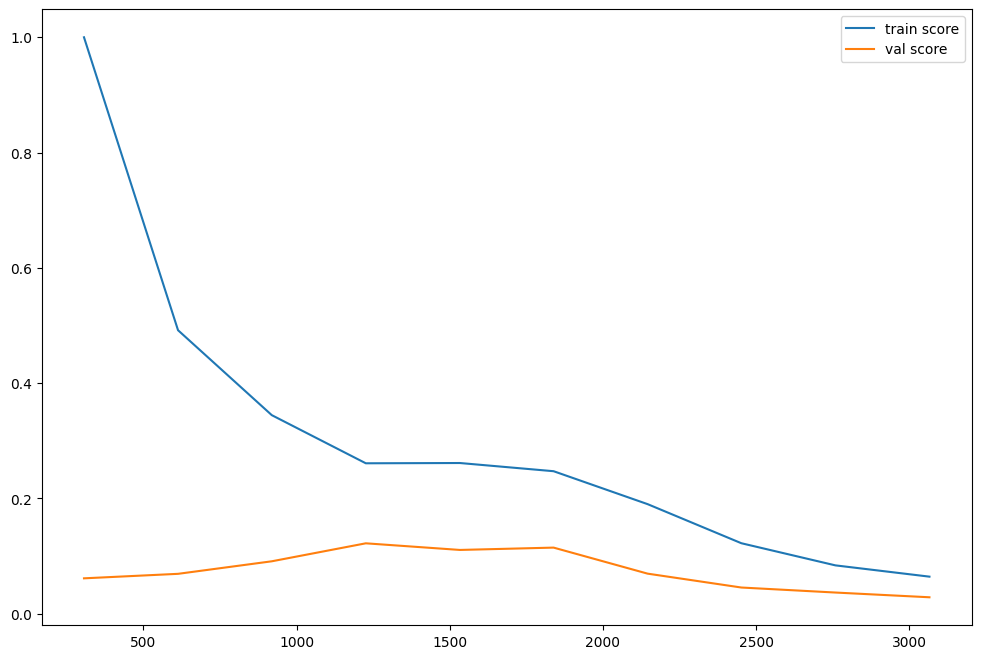

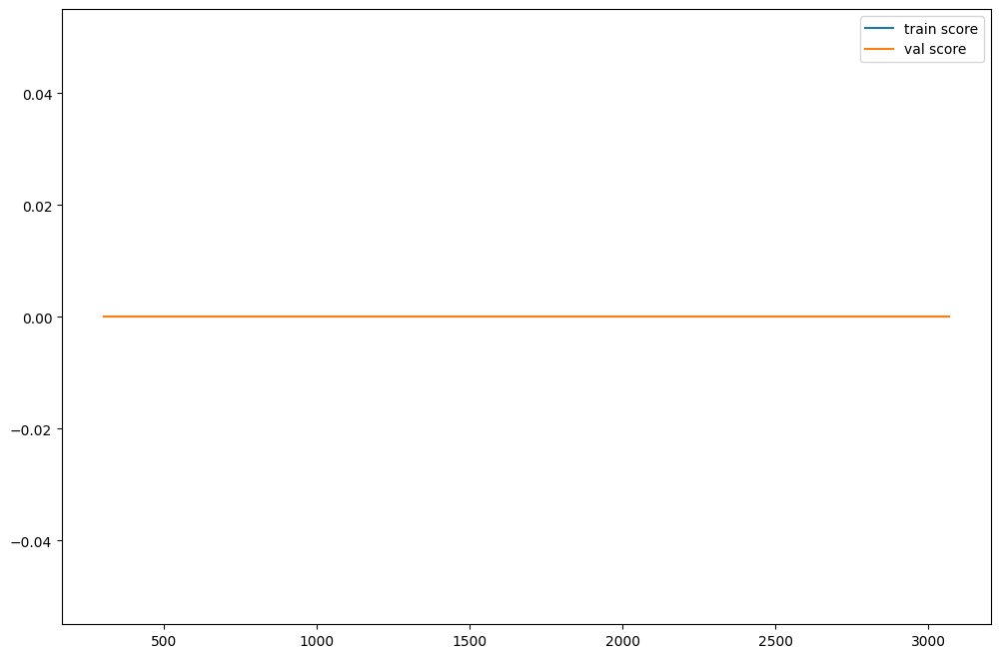

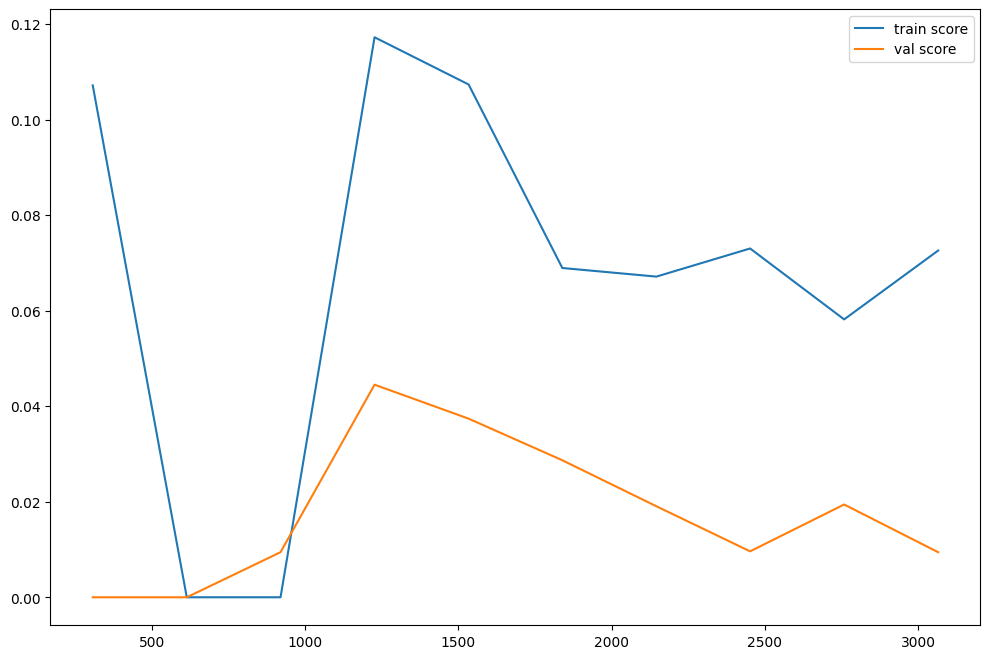

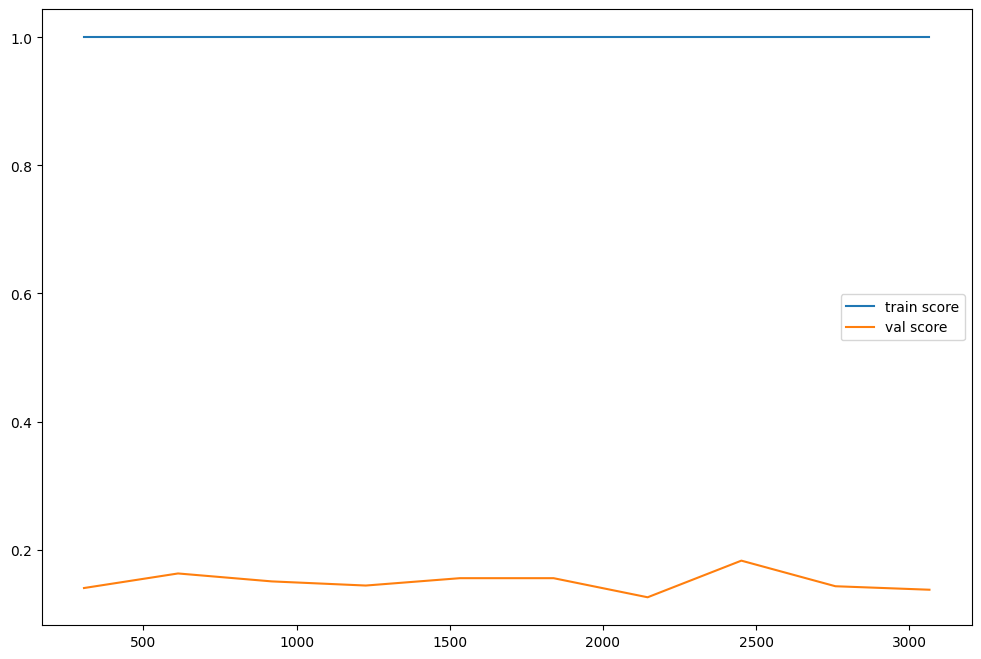

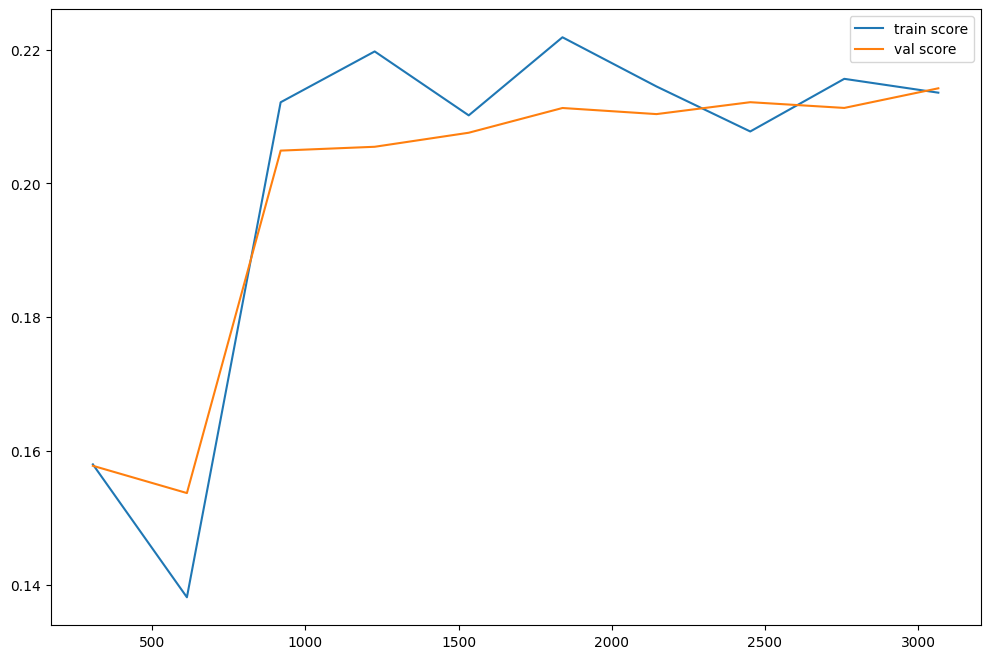

In [40]:
for name, models in list_of_models.items() :
    print(models)
    evaluate(models)

In [41]:
param = {'decisiontreeclassifier__criterion':["gini", "entropy", "log_loss"],'decisiontreeclassifier__min_samples_split' :np.arange(1,5),
         'decisiontreeclassifier__min_samples_leaf':np.arange(1,5),'decisiontreeclassifier__ccp_alpha':np.linspace(1,9,10) }

In [42]:
grid=GridSearchCV(deci,param,cv=4)
grid.fit(X_train,y_train)

C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
480 fits failed out of a total of 1920.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
480 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HIGH-TEC

GridSearchCV(cv=4,
             estimator=Pipeline(steps=[('robustscaler', RobustScaler()),
                                       ('decisiontreeclassifier',
                                        DecisionTreeClassifier())]),
             param_grid={'decisiontreeclassifier__ccp_alpha': array([1.        , 1.88888889, 2.77777778, 3.66666667, 4.55555556,
       5.44444444, 6.33333333, 7.22222222, 8.11111111, 9.        ]),
                         'decisiontreeclassifier__criterion': ['gini',
                                                               'entropy',
                                                               'log_loss'],
                         'decisiontreeclassifier__min_samples_leaf': array([1, 2, 3, 4]),
                         'decisiontreeclassifier__min_samples_split': array([1, 2, 3, 4])})

In [44]:
grid.best_params_

{'decisiontreeclassifier__ccp_alpha': 1.0,
 'decisiontreeclassifier__criterion': 'gini',
 'decisiontreeclassifier__min_samples_leaf': 1,
 'decisiontreeclassifier__min_samples_split': 2}

In [47]:
modelF= grid.best_estimator_
modelF.score(X_train,y_train)

0.9522994129158513

In [49]:
param={'gaussiannb__var_smoothing': np.linspace(1,10,30)}

In [50]:
Grid=GridSearchCV(gauss,param,cv=5)
Grid.fit(X_train,y_train)

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('robustscaler', RobustScaler()),
                                       ('gaussiannb', GaussianNB())]),
             param_grid={'gaussiannb__var_smoothing': array([ 1.        ,  1.31034483,  1.62068966,  1.93103448,  2.24137931,
        2.55172414,  2.86206897,  3.17241379,  3.48275862,  3.79310345,
        4.10344828,  4.4137931 ,  4.72413793,  5.03448276,  5.34482759,
        5.65517241,  5.96551724,  6.27586207,  6.5862069 ,  6.89655172,
        7.20689655,  7.51724138,  7.82758621,  8.13793103,  8.44827586,
        8.75862069,  9.06896552,  9.37931034,  9.68965517, 10.        ])})

In [51]:
Grid.best_params_

{'gaussiannb__var_smoothing': 1.0}

In [52]:
model2=Grid.best_estimator_
model2.score(X_train,y_train)

0.9522994129158513

In [59]:
param2= {'kneighborsclassifier__n_neighbors':np.arange(10),'kneighborsclassifier__metric':['minkowski','euclidean','manhattam']}
Grid2 = GridSearchCV(KNN,param2,cv=5)

In [60]:
Grid2.fit(X_train,y_train)

C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py:540: FitFailedWarning: 
60 fits failed out of a total of 150.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
10 fits failed with the following error:
Traceback (most recent call last):
  File "C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\model_selection\_validation.py", line 888, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\HIGH-TECH CORP'S\AppData\Roaming\Python\Python311\site-packages\sklearn\base.py", line 1473, in wrapper
    return fit_method(estimator, *args, **kwargs)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "C:\Users\HIGH-TECH C

GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('robustscaler', RobustScaler()),
                                       ('kneighborsclassifier',
                                        KNeighborsClassifier())]),
             param_grid={'kneighborsclassifier__metric': ['minkowski',
                                                          'euclidean',
                                                          'manhattam'],
                         'kneighborsclassifier__n_neighbors': array([0, 1, 2, 3, 4, 5, 6, 7, 8, 9])})

In [61]:
Grid2.best_params_

{'kneighborsclassifier__metric': 'minkowski',
 'kneighborsclassifier__n_neighbors': 8}

In [62]:
KnnFinal = Grid2.best_estimator_

In [63]:
KnnFinal.score(X_train,y_train)

0.9515655577299413

In [69]:
confusion_matrix(y_test,KnnFinal.predict(X_test))

array([[967,   1],
       [ 54,   0]], dtype=int64)

malgre que les scores sont bons lorsque nous regardons la matrice de confusion de chaque modele ameliorer par le gridseach cv nous constatons que la marchine a du mal a predire la deuxieme categorie (1 si le patient a eu un accident vasculaire cérébral) cette situation peut etre comprehensible car la dataset n'etant pas equilibre la marchine apprend plus a classifie les individus de la categorie (0). pour resoudre ce probleme je penses qu'il faudrait enrichit notre dataset notamment avec des features de la classe 1